# 영업 성공 여부 분류 경진대회

## 1. 데이터 확인

### 필수 라이브러리

In [ ]:
# pip install pandas 

In [ ]:
# pip install numpy

In [ ]:
# pip install scikit-learn

In [ ]:
# pip install seaborn

In [ ]:
# pip install matplotlib

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import (
    accuracy_score,
    confusion_matrix,
    f1_score,
    precision_score,
    recall_score,
)
from sklearn.model_selection import train_test_split
# from sklearn.tree import DecisionTreeClassifier

import warnings
warnings.filterwarnings('ignore') # 경고 메세지 무시

### 데이터 셋 읽어오기

In [12]:
df_train = pd.read_csv("../data/train.csv") # 학습용 데이터
df_test = pd.read_csv("../data/submission.csv") # 테스트 데이터(제출파일의 데이터)

In [4]:
df_train.tail() # 학습용 데이터 살펴보기

,bant_submit,customer_country,business_unit,com_reg_ver_win_rate,customer_idx,customer_type,enterprise,historical_existing_cnt,id_strategic_ver,it_strategic_ver,...,response_corporate,expected_timeline,ver_cus,ver_pro,ver_win_rate_x,ver_win_ratio_per_bu,business_area,business_subarea,lead_owner,is_converted
59294,1.00,/Sląskie/Poland,AS,NaN,33747,End Customer,SMB,NaN,NaN,NaN,...,LGEPL,3 months ~ 6 months,0,0,0.000026,0.028777,public facility,Others,694,False
59295,0.75,/Bogotá DC /Colombia,AS,0.04,35420,Specifier/ Influencer,Enterprise,NaN,NaN,NaN,...,LGECB,9 months ~ 1 year,0,0,0.000026,0.028777,public facility,NaN,39,False
59296,0.75,/Pisco/Peru,AS,0.04,19249,Specifier/ Influencer,Enterprise,NaN,NaN,NaN,...,LGEPR,less than 3 months,0,0,0.000026,0.028777,public facility,NaN,125,False
59297,1.00,/santa cruz bolivia/Peru,AS,0.04,40327,NaN,Enterprise,NaN,NaN,NaN,...,LGEPR,more than a year,0,0,0.000026,0.028777,public facility,NaN,134,False
59298,0.75,/paris/France,Solution,NaN,30268,NaN,Enterprise,NaN,NaN,NaN,...,LGEKR,less than 3 months,0,0,0.000026,NaN,public facility,NaN,441,False


타겟변수(is_converted)를 포함하여 29개의 칼럼으로 이루어져 있고  
59298개의 데이터를 가짐을 확인할수 있다.

In [4]:
df_test.tail() # 테스트 데이터 살펴보기

,id,bant_submit,customer_country,business_unit,com_reg_ver_win_rate,customer_idx,customer_type,enterprise,historical_existing_cnt,id_strategic_ver,...,response_corporate,expected_timeline,ver_cus,ver_pro,ver_win_rate_x,ver_win_ratio_per_bu,business_area,business_subarea,lead_owner,is_converted
5266,13855,0.50,/São Paulo/Brazil,AS,NaN,40292,NaN,Enterprise,10.0,NaN,...,LGESP,NaN,0,0,NaN,NaN,NaN,NaN,97,False
5267,7979,0.25,General / / United States,IT,NaN,47466,NaN,Enterprise,0.0,NaN,...,LGEUS,NaN,0,0,NaN,NaN,NaN,NaN,438,False
5268,12887,0.75,/ OURO BRANCO / Brazil,AS,NaN,46227,Specifier/ Influencer,Enterprise,NaN,NaN,...,LGESP,less than 3 months,0,0,NaN,NaN,NaN,NaN,97,True
5269,17530,0.00,/ / Germany,IT,NaN,45667,End Customer,SMB,NaN,NaN,...,LGEDG,NaN,0,0,NaN,NaN,NaN,NaN,429,False
5270,4330,0.25,/ Ongole / India,AS,NaN,23646,End Customer,Enterprise,NaN,NaN,...,LGEIL,NaN,0,0,NaN,NaN,NaN,NaN,4,True


테스트 데이터의 경우 id 칼럼이 추가되는것을 확인할수 있다.

훈련용 데이터에 대해서 가지고 있는 정보를 확인하면 다음과 같다.

In [4]:
rows, columns = df_train.shape
print("행의 수:", rows)
print("열의 수:", columns)

행의 수: 59299
열의 수: 29


In [ ]:
df_train.dtypes.value_counts()

object     15
float64     8
int64       5
bool        1
Name: count, dtype: int64

In [134]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 59299 entries, 0 to 59298
Data columns (total 29 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   bant_submit              59299 non-null  float64
 1   customer_country         58317 non-null  object 
 2   business_unit            59299 non-null  object 
 3   com_reg_ver_win_rate     14568 non-null  float64
 4   customer_idx             59299 non-null  int64  
 5   customer_type            15338 non-null  object 
 6   enterprise               59299 non-null  object 
 7   historical_existing_cnt  13756 non-null  float64
 8   id_strategic_ver         3444 non-null   float64
 9   it_strategic_ver         1121 non-null   float64
 10  idit_strategic_ver       4565 non-null   float64
 11  customer_job             40566 non-null  object 
 12  lead_desc_length         59299 non-null  int64  
 13  inquiry_type             58358 non-null  object 
 14  product_category      

### 결측치 확인

In [135]:
df_train.isnull().sum() / df_train.shape[0]

bant_submit                0.000000
customer_country           0.016560
business_unit              0.000000
com_reg_ver_win_rate       0.754330
customer_idx               0.000000
customer_type              0.741345
enterprise                 0.000000
historical_existing_cnt    0.768023
id_strategic_ver           0.941921
it_strategic_ver           0.981096
idit_strategic_ver         0.923017
customer_job               0.315908
lead_desc_length           0.000000
inquiry_type               0.015869
product_category           0.326717
product_subcategory        0.844264
product_modelname          0.844365
customer_country.1         0.016560
customer_position          0.000000
response_corporate         0.000000
expected_timeline          0.520464
ver_cus                    0.000000
ver_pro                    0.000000
ver_win_rate_x             0.689421
ver_win_ratio_per_bu       0.741918
business_area              0.689421
business_subarea           0.906811
lead_owner                 0

결측치를 포함하고 있는 변수들이 있음을 확인할수 있다.

### 이상치 확인

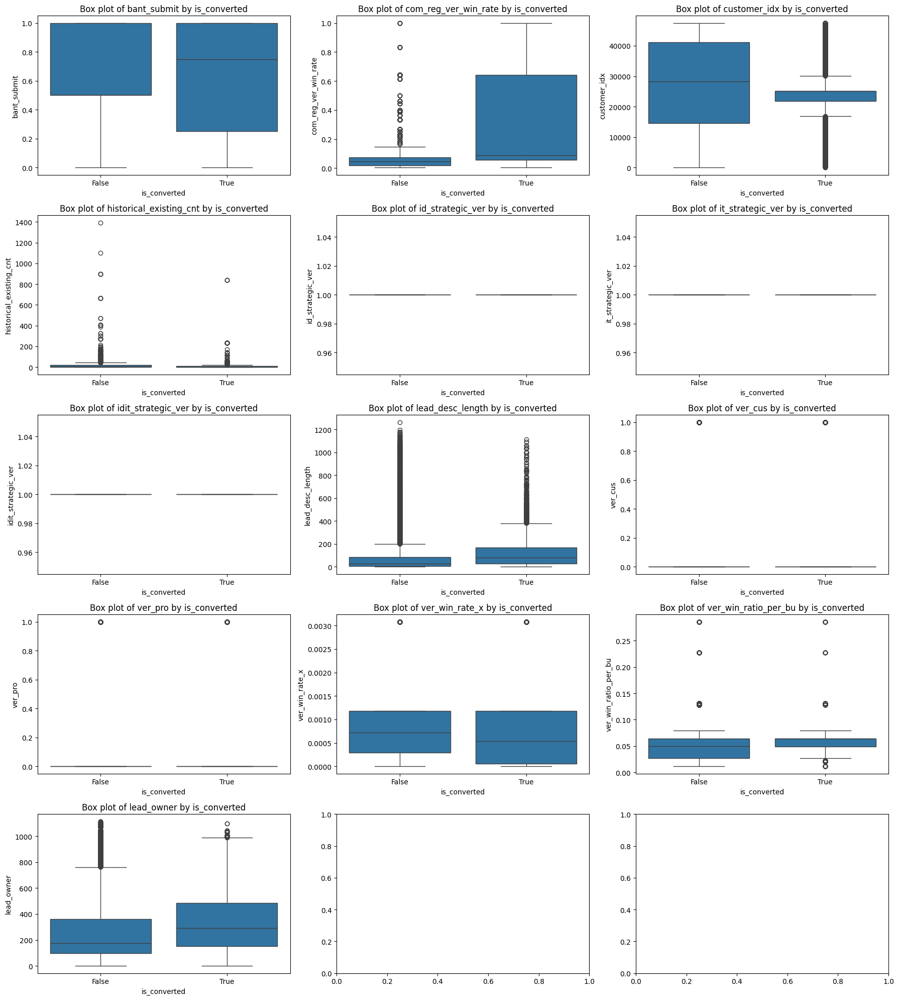

In [6]:
import seaborn as sns
import matplotlib.pyplot as plt

# 수치형 변수만 선택
numeric_vars = df_train.select_dtypes(include=['int64', 'float64']).columns.tolist()

# 변수의 개수에 따라 적절한 행과 열의 개수 설정
n = len(numeric_vars)
ncols = 3  # 열의 개수를 설정
nrows = n // ncols if n % ncols == 0 else n // ncols + 1  # 행의 개수 계산

fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols*6, nrows*4))

for i, var in enumerate(numeric_vars):
    r = i // ncols
    c = i % ncols
    sns.boxplot(x='is_converted', y=var, data=df_train, ax=axs[r, c])
    axs[r, c].set_title('Box plot of ' + var + ' by is_converted')

plt.tight_layout()
plt.show()


In [137]:
# # IQR을 사용하여 이상치 제거
# Q1 = df_train[numeric_vars].quantile(0.25)
# Q3 = df_train[numeric_vars].quantile(0.75)
# IQR = Q3 - Q1

# df_train_clean = df_train[~((df_train[numeric_vars] < (Q1 - 5 * IQR)) | (df_train[numeric_vars] > (Q3 + 5 * IQR))).any(axis=1)]

이상치 대략적으로 잘라낸것으로 세부적으로 재판단하여 제거하는 방향으로 할 예정

### 히스토그램 

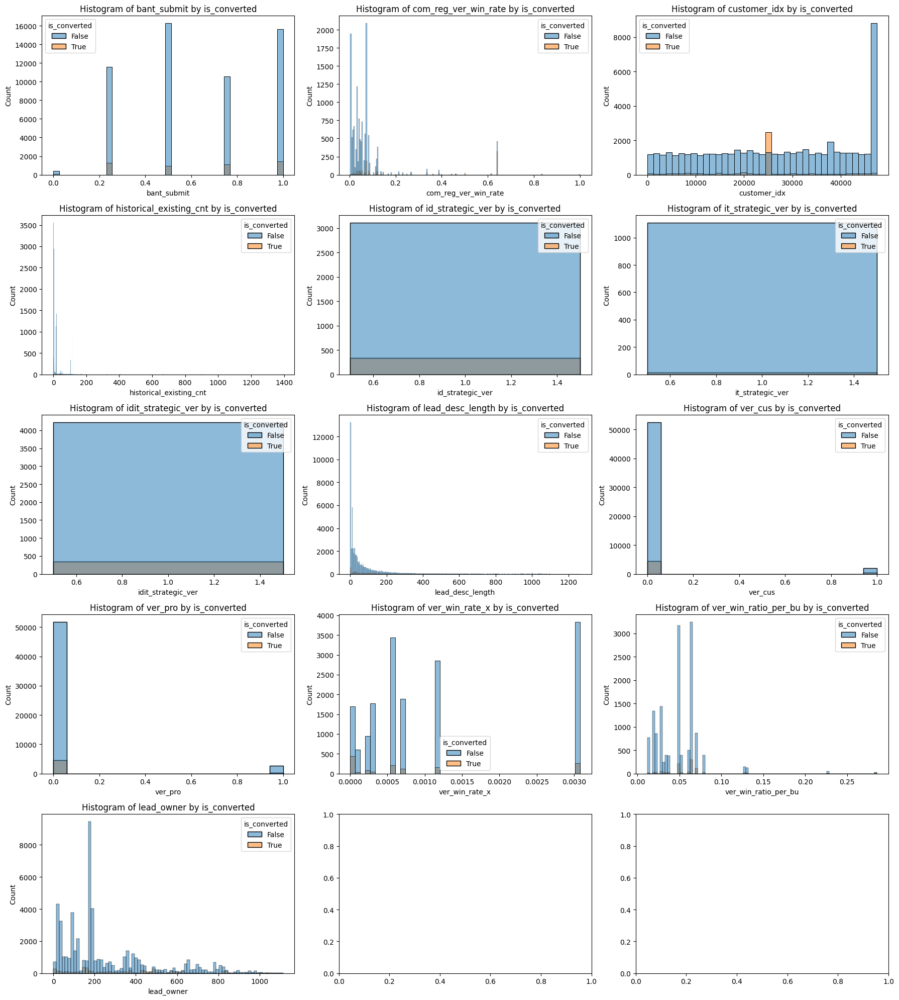

In [14]:
# Select only numeric variables
numeric_vars = df_train.select_dtypes(include=['int64', 'float64']).columns.tolist()

# Determine the number of rows and columns for subplots based on the number of variables
n = len(numeric_vars)
ncols = 3  # Set the number of columns
nrows = n // ncols if n % ncols == 0 else n // ncols + 1  # Calculate the number of rows

# Create subplots
fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols*6, nrows*4))

# Loop through each numeric variable and plot histogram
for i, var in enumerate(numeric_vars):
    r = i // ncols
    c = i % ncols
    sns.histplot(data=df_train, x=var, hue='is_converted', ax=axs[r, c])
    axs[r, c].set_title('Histogram of ' + var + ' by is_converted')

plt.tight_layout()
plt.show()

is_converted가 0일 때와 1일 때의 데이터 개수 차이가 커서 그리는 의미가 없음. 따라서 0일 때와 1일 때를 다른 플롯에 그려야 함.

### 밀도함수

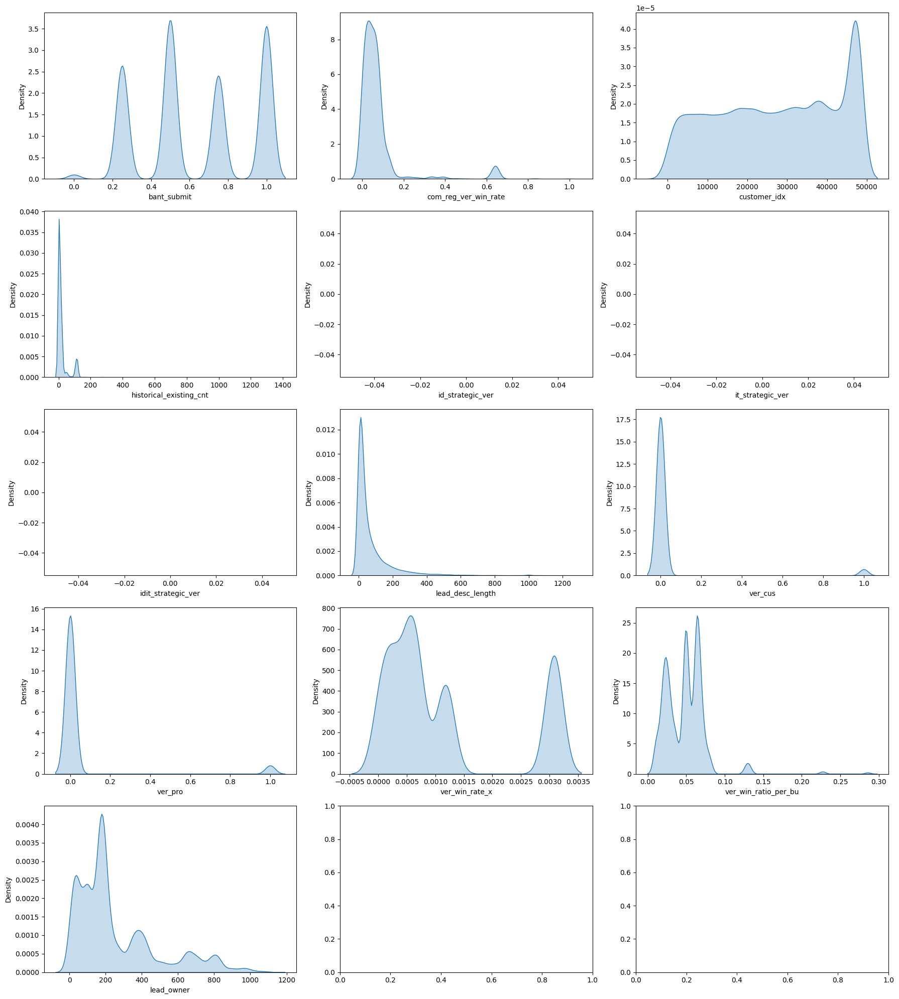

In [15]:
# Create subplots
fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols*6, nrows*4))

# Loop through each numeric variable and plot histogram
for i, var in enumerate(numeric_vars):
    r = i // ncols
    c = i % ncols
    sns.kdeplot(data=df_train[df_train['is_converted'] == 0], x=var, fill = True, ax=axs[r, c])
plt.tight_layout()
plt.show()


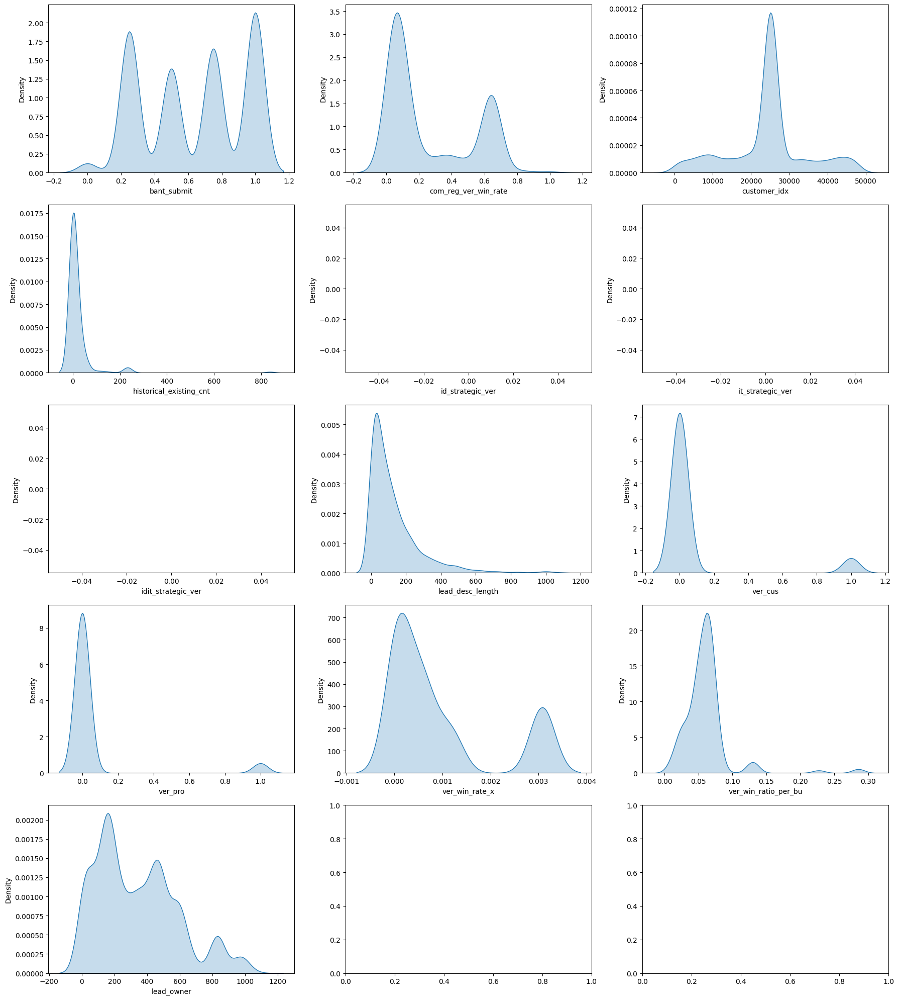

In [16]:
# Create subplots
fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols*6, nrows*4))

# Loop through each numeric variable and plot histogram
for i, var in enumerate(numeric_vars):
    r = i // ncols
    c = i % ncols
    sns.kdeplot(data=df_train[df_train['is_converted'] == 1], x=var, fill = True, ax=axs[r, c])
plt.tight_layout()
plt.show()

### 산점도 

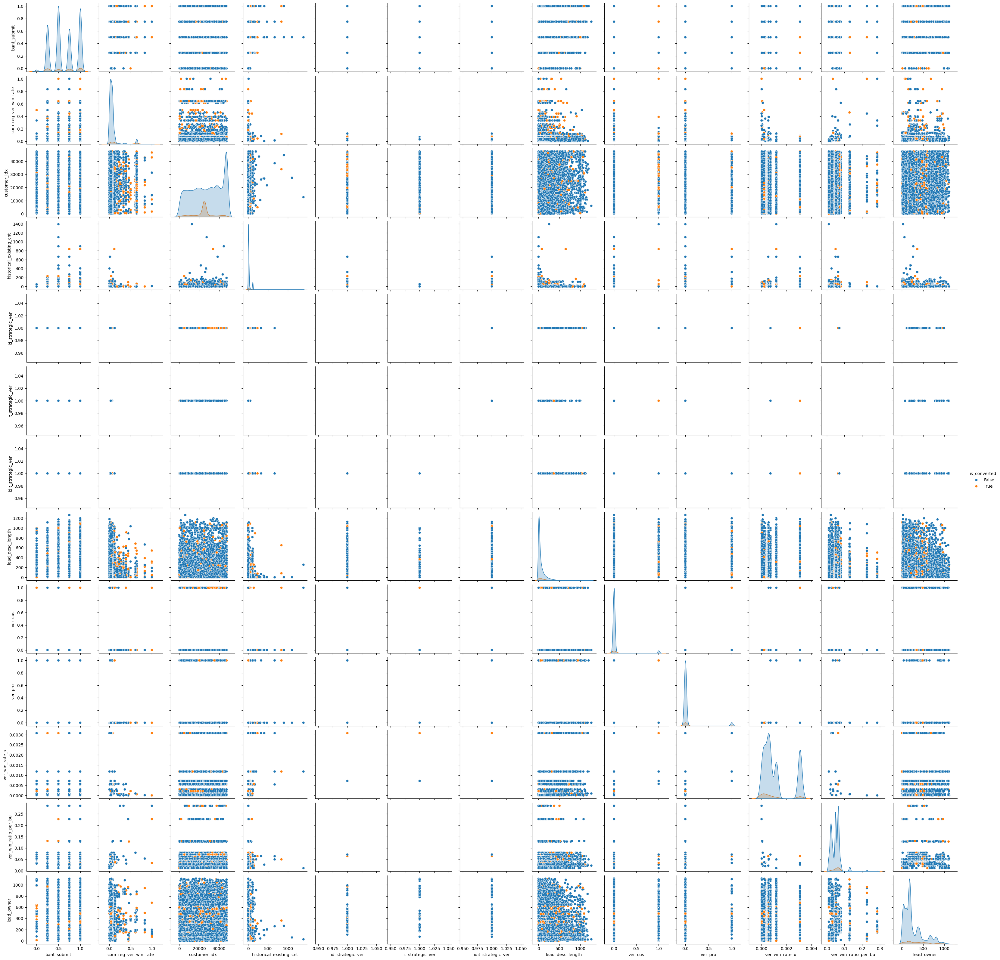

In [17]:
sns.pairplot(df_train, hue = "is_converted")

### 통계량 산출

In [20]:
df_train.describe()

,bant_submit,com_reg_ver_win_rate,customer_idx,historical_existing_cnt,id_strategic_ver,it_strategic_ver,idit_strategic_ver,lead_desc_length,ver_cus,ver_pro,ver_win_rate_x,ver_win_ratio_per_bu,lead_owner
count,59299.000000,14568.000000,59299.000000,13756.000000,3444.0,1121.0,4565.0,59299.000000,59299.000000,59299.000000,18417.000000,15304.000000,59299.000000
mean,0.634593,0.091685,27114.556333,19.912184,1.0,1.0,1.0,79.271590,0.041603,0.050810,0.001117,0.049288,262.563888
std,0.286066,0.150988,14653.911888,44.697938,0.0,0.0,0.0,132.551067,0.199681,0.219612,0.001104,0.027949,231.605681
min,0.000000,0.003788,2.000000,0.000000,1.0,1.0,1.0,1.000000,0.000000,0.000000,0.000002,0.011583,0.000000
25%,0.500000,0.019900,14913.000000,1.000000,1.0,1.0,1.0,7.000000,0.000000,0.000000,0.000298,0.026846,97.000000
50%,0.500000,0.049180,26774.000000,4.000000,1.0,1.0,1.0,29.000000,0.000000,0.000000,0.000572,0.049840,175.000000
75%,1.000000,0.074949,40368.500000,19.000000,1.0,1.0,1.0,92.000000,0.000000,0.000000,0.001183,0.064566,374.000000
max,1.000000,1.000000,47466.000000,1394.000000,1.0,1.0,1.0,1264.000000,1.000000,1.000000,0.003079,0.285714,1114.000000


## 2. 데이터 전처리

### 각 변수별 확인

일단은 크게 처리할만한 부분만 처리하면서 진행해보았음

In [5]:
pd.set_option('display.max_rows', None)

#### 1. bant_submit

In [22]:
df_train['bant_submit'].value_counts()

bant_submit
0.50    17192
1.00    17061
0.25    12852
0.75    11681
0.00      513
Name: count, dtype: int64

#### 2. customer_country

In [28]:
import numpy as np

def process_customer_country(df):
    for i, entry in enumerate(df["customer_country"]):
        if isinstance(entry, str):
            if entry.count('/') == 2:
                last_slash_index = entry.rfind('/')
                if last_slash_index != -1 and last_slash_index != len(entry) - 1:
                    df.at[i, "customer_country"] = entry[last_slash_index + 1:].strip()
                else:
                    df.at[i, "customer_country"] = np.nan
            else:
                df.at[i, "customer_country"] = np.nan
        else:
            df.at[i, "customer_country"] = np.nan
    return df

df_train = process_customer_country(df_train)

print(df_train["customer_country"])


0                                              Philippines
1                                              Philippines
2                                                    India
3                                                    India
4                                                    India
5                                                  Nigeria
6                                             Saudi Arabia
7                                                    India
8                                              Philippines
9                                                    India
10                                                   India
11                                                   India
12                                                   India
13                                                 Nigeria
14                                                 Nigeria
15                                            Saudi Arabia
16                                               Singapo

In [29]:
df_train['customer_country'].value_counts()

customer_country
India                                                        16707
Brazil                                                        7978
United States                                                 3708
Philippines                                                   2494
Mexico                                                        2287
Colombia                                                      1915
U.A.E                                                         1587
Saudi Arabia                                                  1441
United Kingdom                                                1409
Chile                                                         1196
Peru                                                          1109
Italy                                                         1092
Germany                                                        881
Poland                                                         791
Egypt                                        

In [30]:
# 값의 개수를 세어 Series로 반환
value_counts = df_train['customer_country'].value_counts()

# 값이 2개이하 데이터를 찾아 리스트로 반환
single_value_data = value_counts[value_counts <= 2].index.tolist()

# 값이 2개이하 데이터를 'NaN'으로 바꿈
df_train.loc[df_train['customer_country'].isin(single_value_data), 'customer_country'] = np.nan


In [31]:
df_train['customer_country'].value_counts()

customer_country
India                               16707
Brazil                               7978
United States                        3708
Philippines                          2494
Mexico                               2287
Colombia                             1915
U.A.E                                1587
Saudi Arabia                         1441
United Kingdom                       1409
Chile                                1196
Peru                                 1109
Italy                                1092
Germany                               881
Poland                                791
Egypt                                 567
Vietnam                               559
Argentina                             471
Spain                                 447
Hong Kong                             366
Australia                             363
Panama                                326
France                                271
Ecuador                               267
Turkey           

#### 3. business_unit

In [32]:
df_train['business_unit'].value_counts()

business_unit
ID          25563
AS          24774
IT           8664
Solution      296
CM              2
Name: count, dtype: int64

In [ ]:
cm_data = df_train[df_train['business_unit'] == 'CM']
print(cm_data)

       bant_submit  customer_country business_unit  com_reg_ver_win_rate  \
52519          0.5  /Curitiba/Brazil            CM                   NaN   
52520          0.5  /Curitiba/Brazil            CM                   NaN   

       customer_idx customer_type  enterprise  historical_existing_cnt  \
52519         24728           NaN  Enterprise                      NaN   
52520         24728           NaN  Enterprise                      NaN   

       id_strategic_ver  it_strategic_ver  ...  response_corporate  \
52519               NaN               NaN  ...               LGESP   
52520               NaN               NaN  ...               LGESP   

      expected_timeline  ver_cus ver_pro ver_win_rate_x ver_win_ratio_per_bu  \
52519               NaN        0       0            NaN                  NaN   
52520               NaN        0       0            NaN                  NaN   

      business_area business_subarea lead_owner is_converted  
52519           NaN              

준홍 : business_unit의 값아 CM 데이터를 제거하기에는 타겟변수(is_converted)에서 모두 False라는 값을 도출해 냄과 동시에
다른 변수에서 NaN 값으로 대부분 채워져있는것을 보면 CM일수록 is_converted일 가능성이 높다고 판단
따라서 drop하지않고 그대로 유지(물론 test 데이터에는 CM값이 있지는 않음)

인규 : 대부분의 변수가 NaN이면, 거의 공갈빵마냥 텅텅 빈 데이터라 의미가 없을 것 같아서 지워도 상관 없을듯. 냅두면 모델이 response_corporate와 lead_owner을 가지고 is_converted를 판단하는 데 오히려 안좋은 영향을 줄 거 같기도 하고. 그리고 CM 찾아보니까 바드오빠가 건설사업관리나 고객관리의 줄임말로 쓰인다고 함. 


#### 4. com_reg_ver_win_rate

In [33]:
df_train['com_reg_ver_win_rate'].value_counts()

com_reg_ver_win_rate
0.074949    1130
0.003937     803
0.073248     791
0.642857     782
0.003788     713
0.031196     609
0.004000     434
0.124122     431
0.011858     423
0.032787     422
0.080692     410
0.057534     399
0.019900     316
0.044643     292
0.040000     276
0.075000     274
0.028926     253
0.069565     251
0.013514     242
0.067797     240
0.016949     221
0.066667     216
0.049180     214
0.053892     193
0.054422     175
0.049689     172
0.084337     166
0.040816     155
0.043103     153
0.047619     141
0.118421     141
0.033058     128
0.088889     120
0.036036     119
0.118644     118
0.015152     118
0.028986     116
0.333333     110
0.020202     110
0.048544     109
0.019608     107
0.032258     106
0.010989     104
0.068182     103
0.042254     100
0.053191      99
0.017544      96
0.390244      95
0.041667      89
0.071429      82
0.037037      75
0.116279      71
0.018182      65
0.017241      63
0.086957      62
0.136364      60
0.214286      60
0.022727  

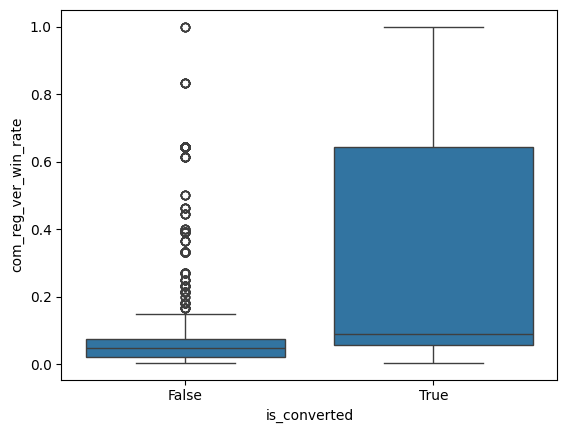

In [34]:
sns.boxplot(x='is_converted', y='com_reg_ver_win_rate', data=df_train)

plt.show()

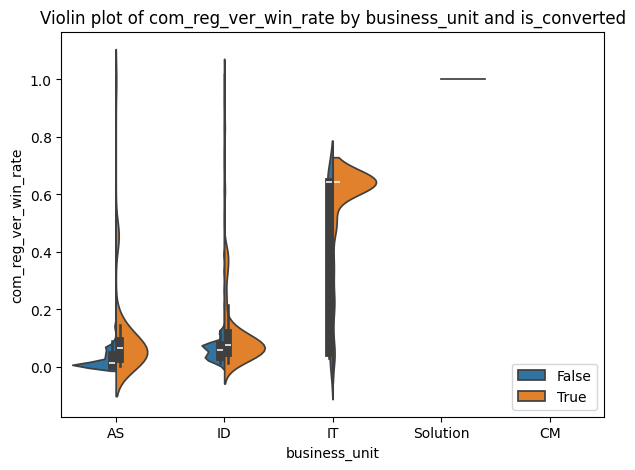

In [6]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(7, 5))
sns.violinplot(x='business_unit', y='com_reg_ver_win_rate', hue='is_converted', data=df_train, split=True)
plt.title('Violin plot of com_reg_ver_win_rate by business_unit and is_converted')
plt.xlabel('business_unit')
plt.ylabel('com_reg_ver_win_rate')
plt.legend(loc='lower right')  # 범례 위치를 우측 하단으로 변경
plt.show()

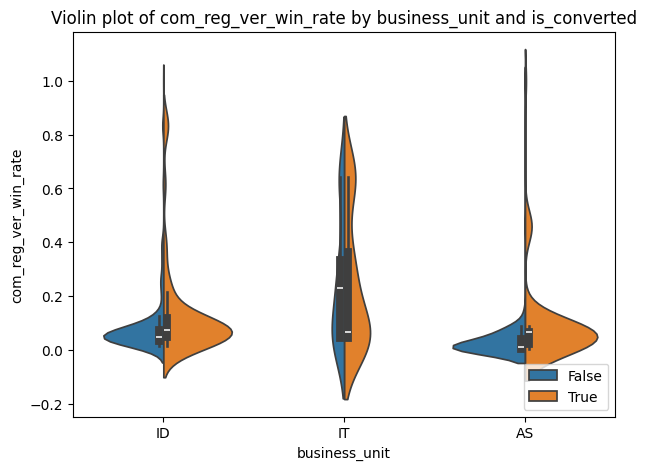

In [7]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(7, 5))
sns.violinplot(x='business_unit', y='com_reg_ver_win_rate', hue='is_converted', data=df_test, split=True)
plt.title('Violin plot of com_reg_ver_win_rate by business_unit and is_converted')
plt.xlabel('business_unit')
plt.ylabel('com_reg_ver_win_rate')
plt.legend(loc='lower right')  # 범례 위치를 우측 하단으로 변경
plt.show()

준홍 : 분포형태가 달라짐 특히 IT부분에서 분포형태가 크게 차이남
-> com_reg_ver_win_rate 와 business_unit 에서 관계성이 유의미하다고 볼수 X

인규 : 분포 형태가 다르면, 관계가 유의미하다고 해석하지 않음? 

#### 5. customer_idx

고객의 회사명

In [48]:
df_train['customer_idx'].value_counts()


customer_idx
47466    7686
25096    2421
37680     367
18030     331
21321     162
33350     135
43395      91
25309      90
33763      88
32240      84
37654      76
31864      71
37657      67
19804      65
29370      61
40344      59
21389      51
7195       50
37399      45
42067      43
14746      43
33776      33
742        30
6555       29
1747       28
46271      27
21883      26
37306      26
40491      26
4936       26
33773      25
9624       25
16590      23
33334      23
41291      22
7810       21
26780      21
20273      20
41505      20
8750       20
42108      19
44254      19
7740       19
31510      19
14804      18
15537      18
17224      18
37643      18
40542      17
20647      16
45319      16
47435      16
32806      16
39506      15
30184      15
310        15
32086      14
22865      14
30207      14
25354      14
9324       14
12753      14
37310      14
21239      14
12193      14
37607      14
28562      14
26337      14
13130      14
963        13
27735  

#### 6. customer_type

고객 유형

In [46]:
# 데이터프레임 생성
table_df = pd.DataFrame(df_train['customer_type'].unique(), columns=['customer_type'])
counts = df_train['customer_type'].value_counts()
table_df['count'] = counts.reset_index(drop=True)
# 테이블 출력
table_df

,customer_type,count
0,End-Customer,10652.0
1,Specifier/Influencer,2568.0
2,Service Partner,1368.0
3,Channel Partner,349.0
4,NaN,146.0
5,Corporate,52.0
6,Solution Eco-Partner,43.0
7,Distributor,31.0
8,Other,20.0
9,System Integrator,20.0


In [37]:
# 카테고리 재할당
df_train['customer_type'] = df_train['customer_type'].replace({
    'Others': 'Other',
    'Etc.': 'Other',
    'Software / Solution Provider': 'Software/Solution Provider',
    'Specifier/ Influencer': 'Specifier/Influencer',
    'Specifier / Influencer': 'Specifier/Influencer',
    'Dealer/Distributor': 'Distributor',
    'Home Owner': 'Homeowner',
    'HVAC Engineer': 'Engineer',
    'Administrator': 'Manager / Director',
    'End-user': 'End-Customer',
    'Commercial end-user': 'End-Customer',
    'End Customer': 'End-Customer',
    'Consultant': 'Architect/Consultant',
    'Technical Assistant': 'Technician'
})

# 데이터프레임 생성
table_df = pd.DataFrame(df_train['customer_type'].unique(), columns=['customer_type'])
counts = df_train['customer_type'].value_counts()
table_df['count'] = counts.reset_index(drop=True)
# 테이블 출력
table_df

,customer_type,count
0,End-Customer,10652.0
1,Specifier/Influencer,2568.0
2,Service Partner,1368.0
3,Channel Partner,349.0
4,NaN,146.0
5,Corporate,52.0
6,Solution Eco-Partner,43.0
7,Distributor,31.0
8,Other,20.0
9,System Integrator,20.0


#### 7. enterprise

[1] Global 기업인지  
[2] Small/Medium 규모의 기업인지

In [38]:
df_train['enterprise'].value_counts()

enterprise
Enterprise    37783
SMB           21516
Name: count, dtype: int64

#### 8. historical_existing_cnt

In [49]:
df_train['historical_existing_cnt'].value_counts()

historical_existing_cnt
4.0       2957
0.0       1973
1.0       1967
19.0      1441
16.0      1132
115.0      854
3.0        695
2.0        594
105.0      308
11.0       217
6.0        141
5.0        138
53.0        83
45.0        82
7.0         69
103.0       63
10.0        60
9.0         51
13.0        49
12.0        48
8.0         43
17.0        42
15.0        34
31.0        31
14.0        30
38.0        25
104.0       24
52.0        24
41.0        22
48.0        21
22.0        20
23.0        19
21.0        19
233.0       18
58.0        17
49.0        17
27.0        16
24.0        14
37.0        13
40.0        13
36.0        13
56.0        12
29.0        11
30.0        11
47.0        11
42.0        11
18.0        10
32.0        10
20.0         9
46.0         9
26.0         8
44.0         8
106.0        8
271.0        8
28.0         8
51.0         8
78.0         7
62.0         7
88.0         7
75.0         6
25.0         6
59.0         6
55.0         6
113.0        6
114.0        5
7

이전에 Converted(영업 전환) 되었던 횟수

#### 9. id_strategic_ver

In [13]:
df_train['id_strategic_ver'].value_counts()

id_strategic_ver
1.0    3444
Name: count, dtype: int64

business_unit의 값을 확인하였을때
ID 사업부의 갯수는 25563개 비해 id_strategic_ver의 1의 값이 3444개인것을 보면
ID 사업부 중에서도 특별히 가중치를 주는 이유가 존재할것으로 보임

In [5]:
# 누락된 값을 0으로 채우기
df_train['id_strategic_ver'].fillna(0, inplace=True)
df_test['id_strategic_ver'].fillna(0, inplace=True)

In [6]:
df_train['id_strategic_ver'].value_counts()

id_strategic_ver
0.0    55855
1.0     3444
Name: count, dtype: int64

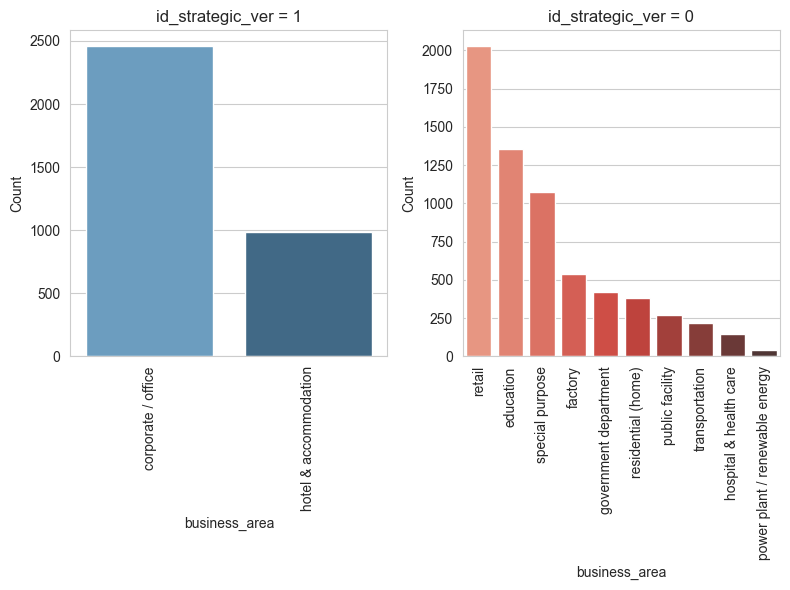

In [7]:
import matplotlib.pyplot as plt
import seaborn as sns

# seaborn 스타일 설정
sns.set_style("whitegrid")

# business_unit이 'ID'인 데이터만 선택
df_train_id = df_train[df_train['business_unit'] == 'ID']

# id_strategic_ver 값에 따라 데이터를 분리
df_train_id_strategic_1 = df_train_id[df_train_id['id_strategic_ver'] == 1]
df_train_id_strategic_0 = df_train_id[df_train_id['id_strategic_ver'] == 0]

# business_area별로 id_strategic_ver 개수를 세어 저장
count_id_strategic_1 = df_train_id_strategic_1['business_area'].value_counts()
count_id_strategic_0 = df_train_id_strategic_0['business_area'].value_counts()

# 그래프
plt.figure(figsize=(8, 6))

plt.subplot(1, 2, 1)
sns.barplot(x=count_id_strategic_1.index, y=count_id_strategic_1.values, palette="Blues_d")
plt.title('id_strategic_ver = 1')
plt.xlabel('business_area')
plt.ylabel('Count')
plt.xticks(rotation=90)

plt.subplot(1, 2, 2)
sns.barplot(x=count_id_strategic_0.index, y=count_id_strategic_0.values, palette="Reds_d")
plt.title('id_strategic_ver = 0')
plt.xlabel('business_area')
plt.ylabel('Count')
plt.xticks(rotation=90)

plt.tight_layout()
plt.show()


특정 사업 영역(Vertical Level1) -> business_area(고객의 사업 영역) 와 관련이 있음을 그래프를 통해 확인할수 있음

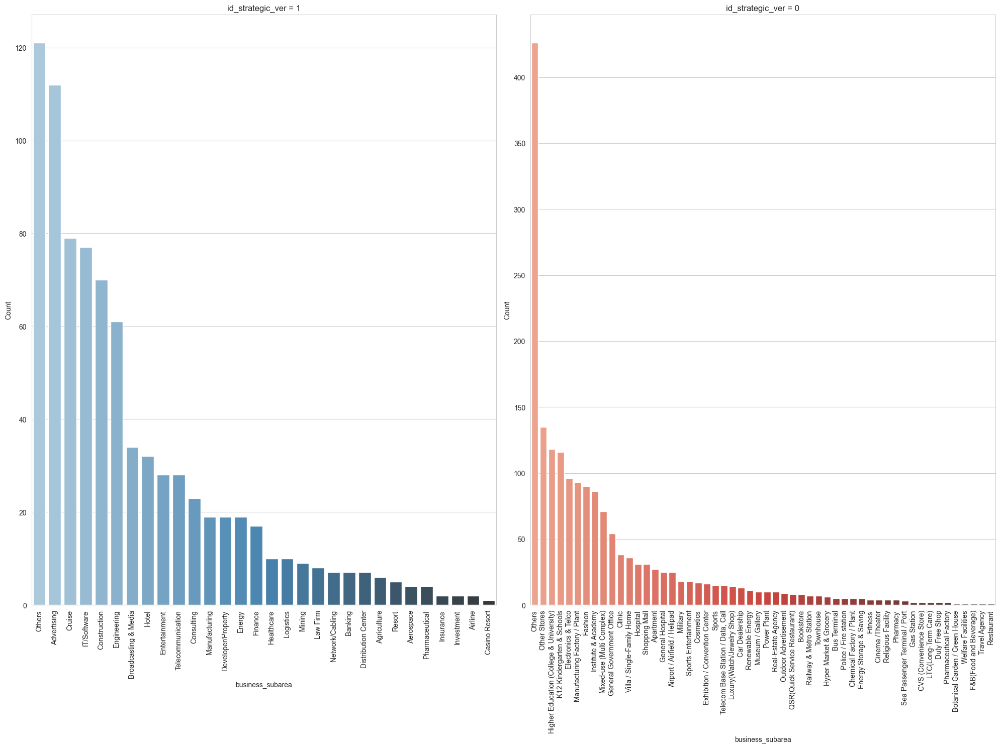

In [8]:
import matplotlib.pyplot as plt
import seaborn as sns

# seaborn 스타일 설정
sns.set_style("whitegrid")

# business_area별로 id_strategic_ver 개수를 세어 저장
count_id_strategic_1 = df_train_id_strategic_1['business_subarea'].value_counts()
count_id_strategic_0 = df_train_id_strategic_0['business_subarea'].value_counts()

# 그래프
plt.figure(figsize=(20, 15))

plt.subplot(1, 2, 1)
sns.barplot(x=count_id_strategic_1.index, y=count_id_strategic_1.values, palette="Blues_d")
plt.title('id_strategic_ver = 1')
plt.xlabel('business_subarea')
plt.ylabel('Count')
plt.xticks(rotation=90)

plt.subplot(1, 2, 2)
sns.barplot(x=count_id_strategic_0.index, y=count_id_strategic_0.values, palette="Reds_d")
plt.title('id_strategic_ver = 0')
plt.xlabel('business_subarea')
plt.ylabel('Count')
plt.xticks(rotation=90)

plt.tight_layout()
plt.show()

In [9]:
# count_id_strategic_0 와 count_id_strategic_1 사이의 차이를 계산
difference = count_id_strategic_0.subtract(count_id_strategic_1, fill_value=0)

# 차이를 출력
print(difference)

business_subarea
Advertising                    -112.0
Aerospace                        -4.0
Agriculture                      -6.0
Airline                          -2.0
Airport / Airfield / Helipad     25.0
                                ...  
Telecommunication               -28.0
Townhouse                         7.0
Travel Agency                     1.0
Villa / Single-Family Home       36.0
Welfare Facilities                1.0
Name: count, Length: 83, dtype: float64


business_subarea (고객의 세부 사업 영역) 부분에서는 유의미한 차이가 보이지않음

id_strategic_ver 는 결국 business_unit이 'ID'이면서,
business_area가 'corporate / office' 또는 'hotel & accommodation'인 값에 대해서
가중치를 주는 변수임을 확인가능

#### 10. it_strategic_ver

In [22]:
df_train['it_strategic_ver'].value_counts()

it_strategic_ver
1.0    1121
Name: count, dtype: int64

In [23]:
# 누락된 값을 0으로 채우기
df_train['it_strategic_ver'].fillna(0, inplace=True)
df_test['it_strategic_ver'].fillna(0, inplace=True)

In [24]:
df_train['it_strategic_ver'].value_counts()

it_strategic_ver
0.0    58178
1.0     1121
Name: count, dtype: int64

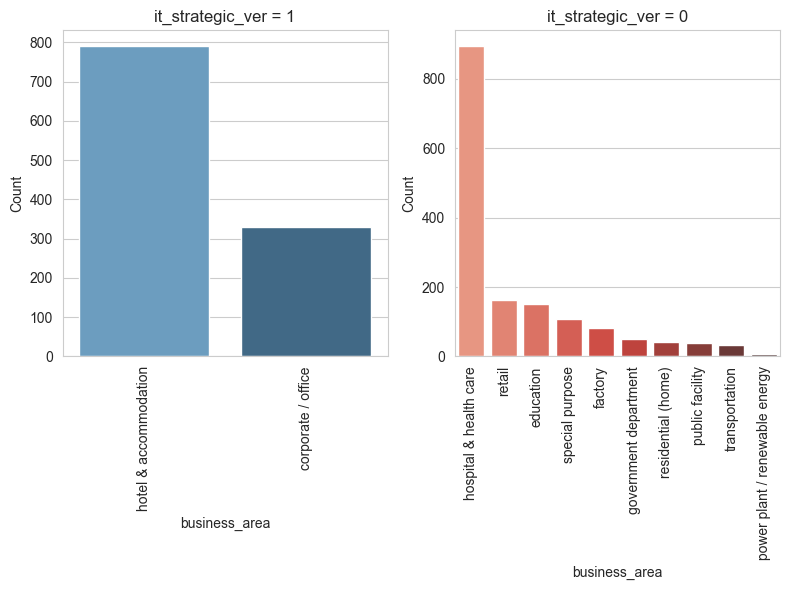

In [25]:
import matplotlib.pyplot as plt
import seaborn as sns

# seaborn 스타일 설정
sns.set_style("whitegrid")

# business_unit이 'ID'인 데이터만 선택
df_train_id = df_train[df_train['business_unit'] == 'IT']

# id_strategic_ver 값에 따라 데이터를 분리
df_train_id_strategic_1 = df_train_id[df_train_id['it_strategic_ver'] == 1]
df_train_id_strategic_0 = df_train_id[df_train_id['it_strategic_ver'] == 0]

# business_area별로 id_strategic_ver 개수를 세어 저장
count_id_strategic_1 = df_train_id_strategic_1['business_area'].value_counts()
count_id_strategic_0 = df_train_id_strategic_0['business_area'].value_counts()

# 그래프
plt.figure(figsize=(8, 6))

plt.subplot(1, 2, 1)
sns.barplot(x=count_id_strategic_1.index, y=count_id_strategic_1.values, palette="Blues_d")
plt.title('it_strategic_ver = 1')
plt.xlabel('business_area')
plt.ylabel('Count')
plt.xticks(rotation=90)

plt.subplot(1, 2, 2)
sns.barplot(x=count_id_strategic_0.index, y=count_id_strategic_0.values, palette="Reds_d")
plt.title('it_strategic_ver = 0')
plt.xlabel('business_area')
plt.ylabel('Count')
plt.xticks(rotation=90)

plt.tight_layout()
plt.show()

it_strategic_ver 는 business_unit이 'It'이면서,
고객의 사업영역은 ID 사업부에서의 가중치와 동일하게
business_area가 'corporate / office' 또는 'hotel & accommodation'인 값에 대해서
가중치를 주는 변수임을 확인가능

#### 11. idit_strategic_ver

Id_strategic_ver이나 it_strategic_ver 값 중   
하나라도 1의 값을 가지면 1 값으로 표현

In [28]:
df_train['idit_strategic_ver'].value_counts()

idit_strategic_ver
0.0    54734
1.0     4565
Name: count, dtype: int64

In [27]:
# 누락된 값을 0으로 채우기
df_train['idit_strategic_ver'].fillna(0, inplace=True)
df_test['idit_strategic_ver'].fillna(0, inplace=True)

#### 12. customer_job

고객의 직업군

In [ ]:
df_train['customer_job'].value_counts()

customer_job
engineering                       6342
other                             4852
administrative                    3359
education                         2287
sales                             2218
                                  ... 
appliance specialist                 1
av estimator                         1
purchasers                           1
pricing                              1
exhibition / convention center       1
Name: count, Length: 560, dtype: int64

#### 13. lead_desc_length

고객이 작성한 Lead Descriptoin 텍스트 총 길이

In [155]:
df_train['lead_desc_length'].value_counts()

lead_desc_length
3       10378
14       3180
2         934
10        891
4         884
5         818
1         771
23        766
11        718
7         656
18        643
35        617
12        604
17        587
15        580
9         579
8         539
28        525
13        522
16        516
6         502
22        498
20        497
33        491
29        490
24        483
19        474
21        462
34        435
27        419
37        416
30        406
25        394
26        387
31        373
32        367
36        354
38        331
43        316
41        313
46        300
40        292
42        276
50        269
39        267
49        265
51        264
47        259
48        256
45        253
57        248
44        246
60        242
52        238
53        231
56        229
58        223
72        216
64        213
73        210
55        208
54        207
70        206
68        203
77        202
59        202
63        202
61        196
65        195
66        191
76 

#### 14. inquiry_type

고객의 문의 유형

In [156]:
df_train['inquiry_type'].value_counts()

inquiry_type
Quotation or purchase consultation                                                                                     23274
Quotation or Purchase Consultation                                                                                     18766
Sales Inquiry                                                                                                           9977
Product Information                                                                                                     1237
Other                                                                                                                    929
Usage or technical consultation                                                                                          668
Trainings                                                                                                                434
Technical Consultation                                                                                          

In [157]:
# 'inquiry_type' 열의 같은내용에 대해 일관된 값으로 변환
## Ctrl + Shift + [ : 현재 영역 접기
df_train['inquiry_type'] = df_train['inquiry_type'].replace({
    'Quotation or purchase consultation': 'Quotation or Purchase Consultation',
    'Product Information': 'Product Information',
    'Usage or technical consultation': 'Usage or Technical Consultation',
    'Trainings': 'Usage or Technical Consultation',
    'Services': 'Services',
    'Sales Inquiry': 'Sales Inquiry',
    'Etc.': 'Other',
    'Technical Support': 'Usage or Technical Consultation',
    'Request for Partnership': 'Request for Partnership',
    'Request a Demo': 'Usage or Technical Consultation',
    'Request for Distributorship': 'Request for Partnership',
    'Request for quotation or purchase': 'Quotation or Purchase Consultation',
    'Technical Consultation': 'Usage or Technical Consultation',
    'Event Inquiry': 'Services',
    'OEM/ODM Request': 'Request for Partnership',
    'Hospital TV': 'Quotation or Purchase Consultation',
    'EDUCATIONAL EQUIPMENTS': 'Product Information',
    'Digital platform': 'Product Information',
    'TV interactive': 'Product Information',
    'teach': 'Usage or Technical Consultation',
    'Display Textbook and photos': 'Product Information',
    'High inch 86 / 98 or 110': 'Product Information',
    'window facing product': 'Product Information',
    'IDB': 'Product Information',
    'Not specified': 'Other',
    'Evento_SdelEstero': 'Other',
    'first Info and pricing': 'Quotation or Purchase Consultation',
    'sales': 'Sales Inquiry',
    'technical': 'Usage or Technical Consultation',
    'usage or technical consultation': 'Usage or Technical Consultation',
    'usage_or_technical_consultation': 'Usage or Technical Consultation',
    'quotation_or_purchase_consultation': 'Quotation or Purchase Consultation',
    'quotation_': 'Quotation or Purchase Consultation',
    'other_': 'Other',
    'Request for technical consulting': 'Usage or Technical Consultation',
    'Purchase or Quotation': 'Quotation or Purchase Consultation',
    'estoy buscando para Ecuador este producto LG MAGNIT micro LED, para un cliente de 138 pulgadas, con envió marítimo': 'Quotation or Purchase Consultation',
    'Hola me pueden cotizar 19 pantallas interactivas de 100 pulgadas entregadas en Guayaquil -Ecuador.': 'Quotation or Purchase Consultation',
    'Solicito apoyo para realizar cotizacion de los dispositivos que ofrecen en la solución One Quick': 'Quotation or Purchase Consultation',
    'Intégrateur historique du George V': 'Product Information',
    'Vui lòng báo giá giúp mình sản phẩm đo thân nhân để đo nhiệt độ cơ thể trong điều kiện phòng thí nghiệm': 'Quotation or Purchase Consultation',
    'Probeam precio': 'Quotation or Purchase Consultation',
    'Quotation or Purchase consultation': 'Quotation or Purchase Consultation',
    'Hotel TV products': 'Quotation or Purchase Consultation',
    'Pantallas Interactivas para Clinicas': 'Quotation or Purchase Consultation',
    'Solicito apoyo para realizar cotizacion de los dispositivos que ofrecen en la solución One Quick:': 'Quotation or Purchase Consultation',
    'LED Signage': 'Product Information',
    'Standalone': 'Product Information',
    'Video Wall': 'Product Information',
    'Toi muon tim hieu thong tin ky thuat, gia ca cua san pham Smart Board SBM-700-70': 'Quotation or Purchase Consultation',
    'tôi cần tham khảo giá và giải pháp từ LG': 'Quotation or Purchase Consultation',
    'Preciso de um monitor médico para radiografia de alta resolução e softwares dedicados': 'Quotation or Purchase Consultation',
    'VRF': 'Product Information',
    'Sales inquiry': 'Sales Inquiry',
    'i want to know the details about it': 'Other',
    'Needs': 'Other',
    'AIO': 'Product Information',
    'One Quick:Flex': 'Product Information',
    'Media Inquiry': 'Other',
    'Purchase': 'Quotation or Purchase Consultation',
    'technical_consultation': 'Usage or Technical Consultation',
    'Customer Suggestions': 'Other',
    '(Select ID_Needs)': 'Other',
    'for school': 'Quotation or Purchase Consultation',
    'quotation_or_purchase_consultation': 'Quotation or Purchase Consultation',
    'quotation_': 'Quotation or Purchase Consultation',
    'Evento_SdelEstero': 'Other',
    'ETC.': 'Other',
    'IDB': 'Product Information',
    'others': 'Other',
    'quotation_': 'Quotation or Purchase Consultation',
    'Window facing product': 'Product Information',
    'display product': 'Product Information',
    'first Info and pricing': 'Quotation or Purchase Consultation',
    'Others' : 'Other',
    'other': 'Other',
    'Vui lòng báo giá giúp mình sản phẩm đo thân nhiệt Xin cảm ơn': 'Quotation or Purchase Consultation',
    'Toi muon tim hieu thong tin ky thuat, gia ca cua sp de su dung': 'Quotation or Purchase Consultation',
    'estoy buscando para Ecuador este producto LG MAGNIT micro LED, para un cliente de 138 pulgadas, con envió marítimo.': 'Quotation or Purchase Consultation',
    'Solicito apoyo para realizar cotizacion de los dispositivos que ofrecen en la solución One Quick:': 'Quotation or Purchase Consultation',
    'Preciso de um monitor médico para radiografia convencional e tomogrtafia.': 'Quotation or Purchase Consultation'
})

df_train['inquiry_type'].value_counts()

inquiry_type
Quotation or Purchase Consultation                                                                    42400
Sales Inquiry                                                                                         10081
Usage or Technical Consultation                                                                        2397
Other                                                                                                  1420
Product Information                                                                                    1262
Services                                                                                                420
Request for Partnership                                                                                 377
Solicito apoyo para realizar cotizacion de los dispositivos que ofrecen en la solución One Quick:         1
Name: count, dtype: int64

In [158]:
# 전반적인 데이터 출력되도록
# pd.set_option('display.max_rows', None)

In [159]:
# 데이터프레임 생성
table_df = pd.DataFrame(df_train['inquiry_type'].unique(), columns=['inquiry_type'])
counts = df_train['inquiry_type'].value_counts()
table_df['count'] = counts.reset_index(drop=True)
# 테이블 출력
table_df

,inquiry_type,count
0,Quotation or Purchase Consultation,42400.0
1,Product Information,10081.0
2,Other,2397.0
3,Usage or Technical Consultation,1420.0
4,Services,1262.0
5,Sales Inquiry,420.0
6,Request for Partnership,377.0
7,NaN,1.0
8,Solicito apoyo para realizar cotizacion de los...,NaN


#### 15. product_category

요청 제품 카테고리

In [160]:
df_train['product_category'].value_counts()

product_category
interactive digital board                                                                               6154
vrf                                                                                                     5640
multi-split                                                                                             3674
video wall signage                                                                                      2029
etc.                                                                                                    2018
led signage                                                                                             1895
interactive signage                                                                                     1862
single-split                                                                                            1569
rac                                                                                                     1447
ol

In [50]:
df_train['product_category'] = df_train['product_category'].replace({
    'rac': 'Air Conditioner',
    'vrf,chiller': 'Air Conditioner',
    'single package': 'Air Conditioner',
    'scroll compressor': 'Others',
    'pantalla led outdoor': 'Digital Signage',
    'not specified': 'Others',
    'etc.': 'Others',
    'vrf,multi-split,etc.': 'Air Conditioner',
    'vrf,multi-split,heating': 'Air Conditioner',
    'vrf,single-split,chiller': 'Air Conditioner',
    'solar,robot': 'Solar',
    'rac single cac': 'Air Conditioner',
    'teto ou cassete inverter': 'Air Conditioner',
    'multi inverter': 'Air Conditioner',
    '28mq780': 'TV and Display',
    '32 pol': 'TV and Display',
    'tv 43 pol': 'TV and Display',
    '43 pol': 'TV and Display',
    'commercial tv,solar,ess,monior/monitor tv,pc,p...': 'TV and Display',
    'tv,refrigerator': 'TV and Display',
    'a definir': 'Others',
    'điều hòa trung tâm chiller': 'Air Conditioner',
    'điều hòa cục bộ': 'Air Conditioner',
    'tv 55"': 'TV and Display',
    'surgical monitor': 'Medical Display',
    'gsca046': 'Others',
    'gscd100': 'Others',
    'procentric': 'Others',
    'tv signage': 'TV and Display',
    'collaboration displays': 'Digital Signage',
    'id': 'Others',
    'meeting & screen sharedirect view leddirect vi...': 'Digital Signage',
    'window facing display': 'Digital Signage',
    'lg customer care program': 'Others',
    'led': 'TV and Display',
    'lainnya': 'Others',
    'control': 'Others',
    'pendingin': 'Others',
    'ar condicionado residencial': 'Air Conditioner',
    'multi v5 vrf': 'Air Conditioner',
    'split tunggal': 'Air Conditioner',
    'multi v': 'Air Conditioner',
    'ac rumah': 'Air Conditioner',
    'aire acondicionado residencial': 'Air Conditioner',
    'אחר': 'Others',
    'vrf,multi-split': 'Air Conditioner',
    'vrf,multi-split,chiller': 'Air Conditioner',
    'vrf,multi-split,single-split,chiller,heating': 'Air Conditioner',
    'error': 'Others',
    'others': 'Others',
    'computer monitors': 'TV and Display',
    'monitor & pc': 'Digital Signage',
    'medical monitors': 'Medical Display',
    'system air conditioner': 'Air Conditioner',
    'solar,ess,ems': 'Solar',
    'tv,mobile': 'TV and Display',
    'commercial tv,projector': 'TV and Display',
    'aircare,water care': 'Heating and Ventilation',
    'monior/monitor tv,chiller': 'TV and Display',
    'system ac,chiller': 'Heating and Ventilation',
    'system ac,aircare': 'Heating and Ventilation',
    'monitor signage,commercial tv,solar,ess': 'Solar',
    'system ac,tv': 'Air Conditioner',
    'solar': 'Solar',
    'monior/monitor tv,pc': 'TV and Display',
    'monitor signage,pc': 'Digital Signage',
    'solar,monior/monitor tv': 'Solar',
    'solar,projector': 'Solar',
    'commercial tv,robot': 'TV and Display',
    'energy storage system': 'Energy Storage',
    'tv,audio/video': 'TV and Display',
    'monitor signage,audio/video': 'Digital Signage',
    'monitor signage,commercial tv,monior/monitor tv,projector,tv': 'Digital Signage',
    'monitor signage,commercial tv,solar,ess,monior/monitor tv,pc': 'Solar',
    'monitor signage,commercial tv,solar,ess': 'Solar',
    'monitor signage,commercial tv,monior/monitor tv,tv': 'Digital Signage',
    'monitor signage,monior/monitor tv,tv,audio/video': 'Digital Signage',
    'pc,tv': 'TV and Display',
    'sac': 'Air Conditioner',
    'monitor signage,solar': 'Solar',
    'solar,refrigerator': 'Solar',
    'monitor signage,system ac': 'Digital Signage',
    'system air conditioner,solar': 'Solar',
    'solar,tv': 'Solar',
    'monitor signage,tv': 'TV and Display',
    'dryer,chiller': 'Heating and Ventilation',
    'videwall': 'Digital Signage',
    'ultra stretch signage': 'Digital Signage',
    'solar,vacuum cleaner': 'Solar',
    'monitor signage,solar,robot,water care': 'Solar',
    'mobile,audio/video': 'Others',
    'system ac,refrigerator,washing machine,dryer': 'Heating and Ventilation',
    'solar,system ac,aircare': 'Solar',
    'projector,system ac,water care': 'TV and Display',
    'chiller,water care': 'Heating and Ventilation',
    'ess,chiller': 'Heating and Ventilation',
    'monitor signage,monior/monitor tv,pc,tv': 'Digital Signage',
    'solar,water care': 'Solar',
    'digital signage or commercial tvs': 'Digital Signage',
    'education createboard': 'Digital Signage',
    'virtual production': 'Others',
    'laec015': 'Others',
    'monitor signage,commercial tv,audio/video': 'Digital Signage',
    'solar,built-in/cooking': 'Solar',
    'monitor signage,monior/monitor tv,commercial tv': 'Digital Signage',
    'commercial tv,monior/monitor tv': 'TV and Display',
    'robot,system ac': 'Others',
    '55us660h0sd.bwz': 'Others',
    'transparent oled': 'Digital Signage',
    'medical- surgical': 'Medical Display',
    'radiology displays': 'Medical Display',
    'high inch 86 / 98 or 110': 'TV and Display',
    'leadallin': 'Others',
    'ฯลฯ': 'Others',
    'commercial tv,water care': 'TV and Display',
    'pc,washing machine': 'Others',
    'system air conditioner,energy storage system': 'Air Conditioner',
    'tv,commercial tv': 'TV and Display',
    'system ac,home beauty': 'Heating and Ventilation',
    'information display,monitor': 'Digital Signage',
    'taa lcd lfd displays': 'Digital Signage',
    'rac/cac': 'Air Conditioner',
    'حلول التدفئة': 'Heating and Ventilation',
    'system ac,chiller,aircare': 'Heating and Ventilation',
    'otros': 'Others',
    'tv,refrigerator,washing machine': 'TV and Display',
    'monior/monitor tv,refrigerator': 'TV and Display',
    'projector,audio/video': 'TV and Display',
    'monior/monitor tv,audio/video': 'TV and Display',
    'refrigerator,washing machine,built-in/cooking': 'Heating and Ventilation',
    'system ac': 'Heating and Ventilation',
    'laec015-gn.awz': 'Others',
    'gscd046': 'Others',
    '32lq621cbsb.awz': 'TV and Display',
    '43uh5f-h.awzm': 'TV and Display',
    '49vl5g-m.awzm': 'TV and Display',
    '55uq801c0sb.bwz': 'TV and Display',
    '43uq751c0sf.bwz': 'TV and Display',
    '32 / 43 pol': 'TV and Display',
    'htv': 'TV and Display',
    '43uq751c0sb.bwz': 'TV and Display',
    '49uh / 49xf': 'TV and Display',
    '50us660h0sd.bwz': 'TV and Display',
    'tv 60"': 'TV and Display',
    'medical monitor': 'Medical Display',
    'aircare,mobile': 'Others',
    'solar,ess,system ac': 'Solar',
    'system ac,refrigerator': 'Heating and Ventilation',
    'tv,pc': 'TV and Display',
    'chiller,refrigerator': 'Heating and Ventilation',
    'commercial tv,solar': 'Solar',
    'monior/monitor tv,projector,audio/video': 'TV and Display',
    'unitario': 'Others',
    'refrigerator,chiller': 'Heating and Ventilation',
    'chiller,tv': 'Heating and Ventilation',
    'projector,ems': 'TV and Display',
    'monitor signage,mobile': 'Digital Signage',
    'robot,vacuum cleaner': 'Others',
    'điều hòa trung tâm multi': 'Air Conditioner',
    'ogrzewanie (pompy ciepła)': 'Heating and Ventilation',
    'soğutucu': 'Others',
    'điều hòa gia dụng': 'Air Conditioner',
    'نظام التدفق المتغيرvrf': 'Air Conditioner',
    'chiller/enfriadoras': 'Heating and Ventilation',
    '49vl5g-m': 'TV and Display',
    'lg led bloc': 'TV and Display',
    'uh': 'Others',
    '55vm5e-a': 'TV and Display',
    'laec15': 'Others',
    '55vm5j-h': 'TV and Display',
    '49vl5f': 'TV and Display',
    'standalone': 'Others',
    'corpouh5f': 'Others',
    'ledallinone': 'TV and Display',
    'monitorindustrial_rmk': 'Digital Signage',
    'lg magnit': 'TV and Display',
    '特別顯示屏': 'Digital Signage',
    'signage': 'Digital Signage',
    'videowall_rmk': 'Digital Signage',
    'bu50nst': 'TV and Display',
    'led 70m2': 'TV and Display',
    'led cinema': 'TV and Display',
    '86uh5f': 'TV and Display',
    '55tc3d': 'TV and Display',
    '43us660h (na)': 'TV and Display',
    'pro centric hotel': 'Digital Signage',
    'video wall + aio': 'Digital Signage',
    'hospitality': 'Others',
    'one:quick': 'Others',
    '高亮度顯示屏': 'Digital Signage',
    'comercial tv': 'TV and Display',
    'corpuh5f-': 'Others',
    'allinone_rmk': 'TV and Display',
    'hoteleria_us670h': 'Others',
    'retaildigital': 'Digital Signage',
    '軟體': 'Others',
    '醫院電視': 'Others',
    'ctv': 'TV and Display',
    'calefacción': 'Heating and Ventilation',
    'autre': 'Others',
    'vb.': 'Others',
    'ac rumah': 'Air Conditioner',
    'เครื่องปรับอากาศเผื่อที่อยู่อาศัย': 'Air Conditioner',
    'aire acondicionado residencial': 'Air Conditioner',
    'vrf - multi v s': 'Air Conditioner',
    'systèmes de débit à réfrigérant variable (drv)': 'Air Conditioner',
    'climatiseur résidentiel': 'Air Conditioner',
    'multi-split (plusieurs pièces)': 'Air Conditioner',
    'aquecimento': 'Heating and Ventilation',
    'khác': 'Others',
    'lg salang air solution for dream homes': 'Others',
    'services': 'Others',
    'آخر': 'Others',
    'vrf,single-split': 'Air Conditioner',
    'vrf,multi-split,single-split,chiller,etc.': 'Air Conditioner',
    'multi-split,single-split': 'Air Conditioner',
    'vrf,multi-split,single-split': 'Air Conditioner',
    'on or several reversible ac': 'Air Conditioner',
    'vrf,multi-split,single-split,chiller': 'Air Conditioner',
    'vrf,multi-split,single-split,heating': 'Air Conditioner',
    'vrf,single-split,chiller': 'Air Conditioner',
    'video wall signage': 'Digital Signage',
    'led signage': 'Digital Signage',
    'interactive signage': 'Digital Signage',
    'single-split': 'Air Conditioner',
    'oled signage': 'Digital Signage',
    'hotel tv': 'TV and Display',
    'chiller': 'Heating and Ventilation',
    'standard signage': 'Digital Signage',
    'medical display': 'Medical Display',
    'lg one:quick series': 'TV and Display',
    'monitor': 'TV and Display',
    'one:quick series': 'TV and Display',
    'heating': 'Heating and Ventilation',
    'high brightness signage': 'Digital Signage',
    'ventilation': 'Heating and Ventilation',
    'high brightness': 'Others',
    'software solution': 'Others',
    'accessories': 'Others',
    'special signage': 'Digital Signage',
    'all lg vrf systems': 'Air Conditioner',
    'commercial display': 'TV and Display',
    'residential air conditioner': 'Air Conditioner',
    'ur640s': 'TV and Display',
    'outros': 'Others',
    'signage care solution': 'Digital Signage',
    'multi v 5 air': 'Air Conditioner',
    'smart tv signage': 'TV and Display',
    'technical support': 'Others',
    'projector': 'TV and Display',
    'ur640': 'TV and Display',
    'cloud device': 'Others',
    'medical displays': 'Medical Display',
    'laptop': 'Others',
    'a thermodynamic water heater': 'Heating and Ventilation',
    'monitor signage,monior/monitor tv': 'Digital Signage',
    'uhd signage': 'Digital Signage',
    'idb': 'Others',
    'commercial tv': 'TV and Display',
    '43us660h0sd.awz': 'TV and Display',
    'digital signage': 'Digital Signage',
    'solar,ess': 'Solar',
    'commercial tv,tv': 'TV and Display',
    'onequick series': 'TV and Display',
    'led 顯示屏': 'Digital Signage',
    'monior/monitor tv,tv': 'TV and Display',
    'multi v water 5': 'Air Conditioner',
    'other': 'Others',
    'tv': 'TV and Display',
    'isıtma': 'Heating and Ventilation',
    'solar,system ac': 'Solar',
    'lg one:quick': 'TV and Display',
    'fhd series': 'TV and Display',
    'sales inquiry': 'Others',
    'washing machine,dryer': 'Others',
    'solar,aircare': 'Solar',
    'interactive digital board': 'Digital Signage',  
    'vrf': 'Air Conditioner',  
    'multi-split': 'Air Conditioner',  
    'hospital tv': 'TV and Display',
    'webos': 'Others',
    'pc': 'Others',
    'pro:centric': 'Digital Signage',
    'video wall': 'Digital Signage',
    '互動式顯示屏': 'Digital Signage',
    'تكييف وتبريد': 'Heating and Ventilation',
    'chiller,aircare': 'Heating and Ventilation',  
    'oled 顯示屏': 'Digital Signage',
    'robots': 'Others',
    'solar,chiller': 'Solar', 
    '標準顯示屏': 'Digital Signage',
    'מזגנים למקום מגורים': 'Air Conditioner',  
    'single split': 'Air Conditioner',
    'monitor signage,commercial tv,monior/monitor tv': 'Digital Signage',
    'مبرد (تشيلر)': 'Heating and Ventilation',
    'commercial tv,audio/video': 'TV and Display',
    'تكييفات': 'Air Conditioner',
    'standard': 'Others',
    'חימום': 'Heating and Ventilation',
    'kimatyzacja vrf': 'Air Conditioner',
    'lg home bliss air solution': 'Others',
    'multi split': 'Air Conditioner',
    'ahu': 'Heating and Ventilation',
    '酒店電視': 'TV and Display',
    'aio': 'Others',
    'one quick:flex': 'TV and Display',
    '50uq801c0sb.bwz': 'TV and Display',
    'ultra stretch series': 'TV and Display',
    'klimatyzacja multi-split': 'Air Conditioner',
    'Heating': 'Heating and Ventilation',
    'system ac,rac': 'Air Conditioner',
    'Energy Storage': 'Energy Storage',
    'signage care solutions': 'Digital Signage',
    'commercial tv,solar,ess,projector,system ac,tv,washing machine,home beauty,audio/video': 'Digital Signage',
    'inne': 'Others',
    'monitor signage,commercial tv,monior/monitor tv,audio/video': 'Digital Signage',
    'single cac': 'Air Conditioner',
    'solar,energy storage system': 'Solar',
    'system ac,solar': 'Solar',
    'solar,system ac,water care': 'Solar',
    '55svh7f-a': 'TV and Display',
    'tr3': 'Others',
    '98uh5e': 'TV and Display',
    'monitor signage,commercial tv,monior/monitor tv,pc,projector,tv,audio/video': 'Digital Signage',
    'monitor signage,monior/monitor tv,vacuum cleaner,tv,home beauty,commercial tv,pc,refrigerator,styler': 'Digital Signage',
    'điều hòa trung tâm vrf': 'Air Conditioner',
    'cac': 'Air Conditioner',
    'monitor signage,commercial tv,monior/monitor tv,pc,tv,home beauty,audio/video': 'Digital Signage',
    'pc,robot,system ac,chiller,tv,refrigerator,washing machine,vacuum cleaner,styler,dryer,mobile,audio/': 'Digital Signage',
    'tv,refrigerator,washing machine,vacuum cleaner,audio/video': 'TV and Display',
    'refrigerator,built-in/cooking': 'Others',
    'vrf,heating': 'Air Conditioner',
    'ems,audio/video': 'Others',
    'projector,ems,mobile,audio/video': 'Digital Signage',
    'smart tv': 'TV and Display',
    'lsca039': 'Others',
    'essential series': 'Others',
    'system ac,tv,refrigerator,washing machine,built-in/cooking,audio/video': 'Others',
    'solar,monior/monitor tv,pc,tv,refrigerator,washing machine,dryer,home beauty': 'Others',
    'monitor signage,monior/monitor tv,system ac,vacuum cleaner,tv,home beauty,commercial tv,mobile,audio': 'Digital Signage',
    'chiller,dryer': 'Heating and Ventilation',
    'solar,dryer': 'Solar',
    'refrigerator': 'Others',
    'parts': 'Others',
    'monior/monitor tv,system ac,tv,refrigerator,washing machine,dryer,built-in/cooking': 'Others',
    'lg paradise air solution': 'Others',
    'פיצול מרובה': 'Others',
    'meeting & screen sharedirect view leddirect view led': 'Digital Signage',
    'one:quick flex': 'TV and Display',
    'videowall signage': 'Digital Signage',
    '110 + video wall': 'Digital Signage',
    'aio | one quick': 'Others',
    'aircare,built-in/cooking': 'Heating and Ventilation',
    'one quick works': 'Others',
    'led aio 136': 'TV and Display',
    'monior/monitor tv,refrigerator,audio/video': 'Digital Signage',
    'monitor signage,commercial tv': 'Others',
    'monitor signage,commercial tv,solar,ess,monior/monitor tv,pc,projector,robot,system ac,ems,rac,chill': 'Others',
    'monior/monitor tv,system ac,tv,pc,refrigerator,water care,solar,washing machine,mobile,chiller,built': 'Others',
    'monitor signage,commercial tv,solar,projector,robot,chiller,refrigerator,built-in/cooking,water care': 'Others',
    'monitor signage,commercial tv,solar,pc,projector,system ac,ems,rac,chiller,refrigerator,washing mach': 'Others',
    'system ac,solar,washing machine': 'Others',
    'monitor signage,solar,monior/monitor tv,pc,projector,robot,system ac,tv,refrigerator,washing machine': 'Others',
    'monior/monitor tv,tv,commercial tv,pc,refrigerator,solar,rac,washing machine,mobile,ess,audio/video': 'Others',
    'commercial tv,solar,ess,monior/monitor tv,pc,projector,robot,system ac,ems,rac,chiller,refrigerator,': 'Others',
})

# 변환된 'product_category' 열의 값 분포 확인
print(df_train['product_category'].value_counts())


product_category
Digital Signage            15435
Air Conditioner            13454
TV and Display              4071
Others                      3604
Heating and Ventilation     2273
Medical Display             1011
Solar                         75
Energy Storage                 2
Name: count, dtype: int64


In [51]:
df_train['product_category'] = df_train['product_category'].replace({
    # 적을수여서 Others 카테고리로 넣어줌
    'Solar' : 'Others',                         
    'Energy Storage': 'Others',
})

# 변환된 'product_category' 열의 값 분포 확인
print(df_train['product_category'].value_counts())

product_category
Digital Signage            15435
Air Conditioner            13454
TV and Display              4071
Others                      3681
Heating and Ventilation     2273
Medical Display             1011
Name: count, dtype: int64


#### 16. product_subcategory

요청 제품 하위 카테고리

In [164]:
df_train['product_subcategory'].value_counts()

product_subcategory
All Medical Displays                                  446
Interactive Digital Board                             417
TR3BF Series                                          374
Transparent OLED Signage                              288
Diagnostic Monitors                                   284
Transparent LED Film                                  280
49" 500 nits FHD Slim Bezel Video Wall                268
TR3DJ Series                                          246
One:Quick Flex                                        243
One:Quick Works                                       228
55" 500 nits FHD 0.44mm Even Bezel Video Wall         209
55" 700 nits FHD 0.44mm Even Bezel Video Wall         180
Digital X-ray Detectors                               167
UH5F-H Series                                         156
US660H Series                                         151
4K UHD Hospitality TV with Pro:Centric Direct         127
VL5F Series                                         

#### 17. product_modelname

요청 제품 모델명

In [165]:
df_train['product_modelname'].value_counts()

product_modelname
UltraFine Ergo(32UN880)                                                                                523
28MQ780                                                                                                479
All Medical Displays                                                                                   350
43HT3WJ                                                                                                290
55CT5WJ                                                                                                261
55VSM5J                                                                                                199
Ergo Dual(27QP88D)                                                                                     167
Diagnostic Monitors                                                                                    167
75TC3D                                                                                                 159
55VSH7J            

#### 18. customer_country.1

담당 자사 법인명 기반의 지역 정보(대륙)

In [166]:
df_train['customer_country.1'].value_counts()

customer_country.1
//India                                                                                                                            3037
/São Paulo/Brazil                                                                                                                  1344
//United States                                                                                                                     962
//United Kingdom                                                                                                                    805
//Saudi Arabia                                                                                                                      718
//Italy                                                                                                                             707
//Philippines                                                                                                                       705
//U.A.E                      

In [52]:
import numpy as np

def process_customer_country(df):
    for i, entry in enumerate(df["customer_country.1"]):
        if isinstance(entry, str):
            last_slash_index = entry.rfind('/')
            if last_slash_index != -1 and last_slash_index != len(entry) - 1:
                df.at[i, "customer_country.1"] = entry[last_slash_index + 1:].strip()
            elif last_slash_index == len(entry) - 1:
                df.at[i, "customer_country.1"] = np.nan
            else:
                last_comma_index = entry.rfind(',')
                if last_comma_index != -1 and last_comma_index != len(entry) - 1:
                    df.at[i, "customer_country.1"] = entry[last_comma_index + 1:].strip()
                else:
                    df.at[i, "customer_country.1"] = np.nan
    return df

df_train = process_customer_country(df_train)

print(df_train["customer_country.1"])


0                                              Philippines
1                                              Philippines
2                                                    India
3                                                    India
4                                                    India
5                                                  Nigeria
6                                             Saudi Arabia
7                                                    India
8                                              Philippines
9                                                    India
10                                                   India
11                                                   India
12                                                   India
13                                                 Nigeria
14                                                 Nigeria
15                                            Saudi Arabia
16                                               Singapo

In [ ]:
# # 전반적인 데이터 출력되도록
# pd.set_option('display.max_rows', None)

# # 데이터프레임 생성
# table_df = pd.DataFrame(df_train['customer_country.1'].unique(), columns=['customer_country.1'])
# counts = df_train['customer_country.1'].value_counts()
# table_df['count'] = counts.reset_index(drop=True)
# # 테이블 출력
# table_df

#### 19. customer_position

고객의 회사 직책

In [45]:
df_train['customer_position'].value_counts()

customer_position
none                      19680
manager                    8217
ceo/founder                7984
other                      6499
director                   4843
                          ...  
chairman                      1
pgt physics                   1
education professional        1
chemistry teacher             1
radiology professional        1
Name: count, Length: 117, dtype: int64

In [54]:
df_train['customer_position'] = df_train['customer_position'].replace({
    'other': 'others',
    'vicepresident': 'vice president',
    'entrylevel': 'entry level',
    'c-levelexecutive': 'c-level executive',
    'av management': 'manager',
    'consultant': 'consulting',
    'bulgaria': 'others',
    'founder': 'ceo/founder',
    'unpaid': 'others',
    'commercial consultant': 'consulting',
    'architect/consultant': 'consulting',
    'architecture/consult': 'consulting',
    'decision influencer': 'decision-influencer',
    'business unit director': 'director',
    'co-founder': 'ceo/founder',
    'product management': 'manager',
    'business unit director': 'director',
    'leadership/executive office/owner': 'c-level executive',
    'ceo/fundador': 'ceo/founder',
    'vp': 'vice president',
    'no influence': 'none',
    'not applicable': 'none',
    'lider de desarrollo': 'director',
    'customer': 'end-user',
    'commercial end-user': 'end-user',
    'vp': 'vice president',
    'exhibitiontv': 'exhibition',
    'chairman': 'ceo/founder',
    'president': 'ceo/founder',
    'decision maker': 'decision-maker',
    'government': 'others',
    'operations': 'manager',
    'other - please specify - cedia association': 'others',
    'sales': 'business development/sales',
    'subsidiary sales (ise)': 'business development/sales',
    'chief executive officer': 'c-level executive',
    'business partner': 'partner',
    'medical device manufacturer': 'manufacturer',
    'quantitative aptitude faculty': 'manufacturer',
    'radiology professional': 'hospital',
    'pathologist': 'hospital',
    'surgery professional': 'hospital',
    'medical imaging specialist': 'hospital',
    'the big boss': 'ceo/founder',
    'software /solution provider': 'engineering',
    'system integrator': 'engineering',
    'business development': 'business development/sales',
    'cargo': 'distributor',
    'the big boss': 'ceo/founder',
    'market intelligence/research': 'associate/analyst',
    'associate professor': 'associate/analyst',
    'associate professor in electronics engg': 'associate/analyst',
    'research': 'associate/analyst',
    'assistant professor of enlish': 'assistant professor',
    'director cum faculty at gaining apex coaching centre': 'director',
    'academic coordinator/ post graduate teacher (accountancy, business studies)/ tgt (ict)': 'educator',
    'academic specialist': 'educator',
    'principal at oxford integrated pu science college': 'educator',
    'english trainer for ielts,toefl,pte,gre,sat exams.': 'educator',
    'hon dean': 'educator',
    'chemistry teacher': 'educator',
    'teacher': 'educator',
    'asst prof.': 'assistant professor',
    'pgt physics': 'educator',
    'education professional': 'educator',
    'senior lecturer': 'educator',
    'gerente': 'manager',
    'mindenes': 'others',
    'education': 'professor',
    'senior lecturer': 'educator',
    'prof.': 'professor',
    'professor of mathematics': 'professor',
    'neet/ olympiad expert faculty': 'professor',
    'guest faculty': 'professor',
    'técnico': 'technical',
    'genel müdür': 'ceo/founder',
    'főorvos': 'hospital',
    'proprietário(a)': 'homeowner',
    'tierarzt': 'hospital',
    'physics faculty': 'professor',
    'teacher/middle school coordinator': 'educator',
    'physics and mathematics teacher': 'math and physics teacher',
    'principal & director': 'director',
    'professional trainer': 'educator',
    'math and physics teacher': 'educator',
    'career coach': 'educator'
})

# 데이터프레임 생성
table_df = pd.DataFrame(df_train['customer_position'].unique(), columns=['customer_position'])
counts = df_train['customer_position'].value_counts()
table_df['count'] = counts.reset_index(drop=True)
# 테이블 출력
table_df

,customer_position,count
0,entry level,19690
1,ceo/founder,8226
2,partner,7993
3,manager,7520
4,vice president,4848
5,associate/analyst,2601
6,c-level executive,2538
7,none,2219
8,director,866
9,others,849


In [55]:
df_train['customer_position'].shape

(59299,)

In [56]:
na_count = df_train['customer_position'].isna().sum()
print("NaN 또는 NA 값의 개수:", na_count)

NaN 또는 NA 값의 개수: 0


#### 20. response_corporate

담당 자사 법인명

In [169]:
df_train['response_corporate'].value_counts()

response_corporate
LGEIL    16908
LGESP     9311
LGEUS     5955
LGEMS     2768
LGEPH     2651
LGEGF     2149
LGECB     2079
LGEUK     1651
LGESJ     1469
LGECL     1339
LGEPS     1252
LGEIS     1146
LGEPR     1131
LGEDG     1051
LGEPL      850
LGEEG      704
LGEVH      614
LGEES      592
LGETK      541
LGEAR      491
LGEKR      433
LGEHK      383
LGEAP      366
LGESL      348
LGEMK      331
LGEFS      302
LGEAF      288
LGEIN      281
LGELF      274
LGESA      268
LGECI      263
LGETH      185
LGEEF      159
LGEPT      111
LGEML      110
LGEBN       99
LGEYK       78
LGECH       65
LGEHS       51
LGETT       47
LGEJP       41
LGEAS       33
LGESW       31
LGEMC       30
LGERO       29
LGEEB       13
LGEAG        8
LGERA        8
LGECZ        7
LGELA        2
LGEUR        1
LGEIR        1
LGEBT        1
Name: count, dtype: int64

#### 21. expected_timeline

In [2]:
# pip install nltk

In [5]:
import nltk 
import string
import re

nltk.download('stopwords')

고객의 요청한 처리 일정

In [175]:
df_train['expected_timeline'].value_counts()

expected_timeline
less than 3 months                                                                                                                                                                                                                                                 17250
3 months ~ 6 months                                                                                                                                                                                                                                                 5026
more than a year                                                                                                                                                                                                                                                    3023
9 months ~ 1 year                                                                                                                                                                          

In [174]:
# # 전반적인 데이터 출력되도록
# pd.set_option('display.max_rows', None)

# # 데이터프레임 생성
# table_df = pd.DataFrame(df_train['expected_timeline'].unique(), columns=['expected_timeline'])
# counts = df_train['expected_timeline'].value_counts()
# table_df['count'] = counts.reset_index(drop=True)
# # 테이블 출력
# table_df

In [16]:
df_train.head()

,bant_submit,customer_country,business_unit,com_reg_ver_win_rate,customer_idx,customer_type,enterprise,historical_existing_cnt,id_strategic_ver,it_strategic_ver,...,response_corporate,expected_timeline,ver_cus,ver_pro,ver_win_rate_x,ver_win_ratio_per_bu,business_area,business_subarea,lead_owner,is_converted
0,1.0,/Quezon City/Philippines,AS,0.066667,32160,End-Customer,Enterprise,NaN,NaN,NaN,...,LGEPH,less than 3 months,1,0,0.003079,0.026846,corporate / office,Engineering,0,True
1,1.0,/PH-00/Philippines,AS,0.066667,23122,End-Customer,Enterprise,12.0,NaN,NaN,...,LGEPH,less than 3 months,1,0,0.003079,0.026846,corporate / office,Advertising,1,True
2,1.0,/Kolkata /India,AS,0.088889,1755,End-Customer,Enterprise,144.0,NaN,NaN,...,LGEIL,less than 3 months,1,0,0.003079,0.026846,corporate / office,Construction,2,True
3,1.0,/Bhubaneswar/India,AS,0.088889,4919,End-Customer,Enterprise,NaN,NaN,NaN,...,LGEIL,less than 3 months,1,0,0.003079,0.026846,corporate / office,IT/Software,3,True
4,1.0,/Hyderabad/India,AS,0.088889,17126,Specifier/ Influencer,Enterprise,NaN,NaN,NaN,...,LGEIL,less than 3 months,0,0,0.003079,0.026846,corporate / office,NaN,4,True


In [12]:
df_train['expected_timeline'] = df_train['expected_timeline'].astype(str)

In [15]:
df_train.drop(columns=['timeline_punct'], inplace=True)

In [17]:
def remove_punct(text):
    text  = "".join([char for char in text if char not in string.punctuation])
    return text

df_train['timeline_punct'] = df_train['expected_timeline'].apply(lambda x: remove_punct(x))
df_train['timeline_punct'].value_counts()

timeline_punct
nan                                                                                                                       30863
less than 3 months                                                                                                        17250
3 months  6 months                                                                                                         5026
more than a year                                                                                                           3023
9 months  1 year                                                                                                           1102
                                                                                                                          ...  
our partner vis networks is working on this inquiry and client is crosschecking the prices hence closing in the system        1
looking for active led in a range of 5 lakhs  not a prospetive buyer                     

In [19]:
def tokenization(text):
    text = re.split('\W+', text)
    return text

df_train['timeline_tokenized'] = df_train['timeline_punct'].apply(lambda x: tokenization(x.lower()))
df_train['timeline_tokenized'].value_counts()

timeline_tokenized
[nan]                                                                                                                                          30863
[less, than, 3, months]                                                                                                                        17250
[3, months, 6, months]                                                                                                                          5026
[more, than, a, year]                                                                                                                           3023
[9, months, 1, year]                                                                                                                            1102
                                                                                                                                               ...  
[our, partner, vis, networks, is, working, on, this, inquiry, and, client, is, crossche

In [23]:
stopword = nltk.corpus.stopwords.words('english')

In [24]:
def remove_stopwords(text):
    text = [word for word in text if word not in stopword]
    return text
    
df_train['timeline_nonstop'] = df_train['timeline_tokenized'].apply(lambda x: remove_stopwords(x))
df_train['timeline_nonstop'].value_counts()

timeline_nonstop
[nan]                                                                                                30863
[less, 3, months]                                                                                    17250
[3, months, 6, months]                                                                                5026
[year]                                                                                                3023
[9, months, 1, year]                                                                                  1102
                                                                                                     ...  
[reachable, lead, shared, partner]                                                                       1
[discussed, client, details, mailed, client, budgets, wont, buy, hence, closing, system]                 1
[partner, vis, networks, working, inquiry, client, crosschecking, prices, hence, closing, system]        1
[looking, active, le

#### 22. ver_cus

특정 Vertical Level 1(사업영역) 이면서  
Customer_type(고객 유형)이 소비자(End-user)인  
경우에 대한 가중치

In [176]:
df_train['ver_cus'].value_counts()

ver_cus
0    56832
1     2467
Name: count, dtype: int64

#### 23. ver_pro

특정 Vertical Level 1(사업영역) 이면서   
특정 Product Category(제품 유형)인   
경우에 대한 가중치

In [178]:
df_train['ver_pro'].value_counts()

ver_pro
0    56286
1     3013
Name: count, dtype: int64

#### 24. ver_win_rate_x

전체 Lead 중에서 Vertical을 기준으로  
[a] Vertical 수 비율  
[b] Vertical 별 Lead 수 대비 영업 전환 성공 비율 값[a] , [b] 를 곱한 값

In [179]:
df_train['ver_win_rate_x'].value_counts()

ver_win_rate_x
0.003079    4097
0.001183    3011
0.000717    2013
0.000543    1929
0.000298    1818
0.000572    1727
0.000060    1199
0.000215    1035
0.000097     650
0.000026     519
0.000013     306
0.000002     113
Name: count, dtype: int64

#### 25. ver_win_ratio_per_bu

특정 Vertical Level1의 Business Unit 별 샘플 수 대비 영업 전환된 샘플 수의 비율을 계산

In [180]:
df_train['ver_win_ratio_per_bu'].value_counts()

ver_win_ratio_per_bu
0.064566    2460
0.049840    2028
0.020121    1365
0.048630    1356
0.026846    1278
0.064070    1075
0.071345     984
0.011583     788
0.022634     713
0.060924     540
0.079412     421
0.036913     403
0.035484     385
0.031579     271
0.053571     216
0.051471     210
0.028777     200
0.022727     173
0.128571     156
0.131148     148
0.227273      62
0.285714      43
0.034483      29
Name: count, dtype: int64

#### 26. business_area

고객의 사업 영역

In [181]:
df_train['business_area'].value_counts()

business_area
corporate / office                4097
retail                            3011
hotel & accommodation             2013
special purpose                   1929
residential (home)                1818
education                         1727
hospital & health care            1199
factory                           1035
government department              650
public facility                    519
transportation                     306
power plant / renewable energy     113
Name: count, dtype: int64

#### 27. business_subarea

고객의 세부 사업 영역

In [182]:
df_train['business_subarea'].value_counts()

business_subarea
Others                                     1740
Other Stores                                280
Hospital                                    267
Manufacturing Factory / Plant               196
Construction                                191
Higher Education (College & University)     186
Engineering                                 183
Villa / Single-Family Home                  172
Apartment                                   163
Electronics & Telco                         135
K12 Kindergarten & Schools                  134
IT/Software                                 132
Advertising                                 120
Institute & Academy                         105
Clinic                                      104
Mixed-use (Multi Complex)                   104
Fashion                                      98
General Government Office                    91
Cruise                                       80
General Hospital                             63
Consulting             

In [6]:
# 데이터프레임 생성
table_df = pd.DataFrame(df_train['business_subarea'].unique(), columns=['business_subarea'])
counts = df_train['business_subarea'].value_counts()
table_df['count'] = counts.reset_index(drop=True)
# 테이블 출력
table_df

,business_subarea,count
0,Engineering,1740.0
1,Advertising,280.0
2,Construction,267.0
3,IT/Software,196.0
4,NaN,191.0
5,Manufacturing,186.0
6,Energy,183.0
7,Developer/Property,172.0
8,Entertainment,163.0
9,Agriculture,135.0


#### 28. lead_owner

영업 담당자 이름

In [183]:
df_train['lead_owner'].value_counts()

lead_owner
174     4627
175     4120
97      2499
23      2453
194     2208
42      1215
96       981
185      880
363      839
115      734
38       693
125      690
402      490
108      487
124      468
816      464
341      462
167      459
100      457
0        429
68       427
16       413
487      405
176      374
40       355
342      346
662      327
422      326
27       317
359      305
205      304
39       304
15       301
279      294
441      281
25       272
155      271
103      270
233      265
374      257
405      246
393      238
589      237
46       235
21       228
831      227
78       223
436      219
148      216
642      215
153      215
694      213
654      208
384      204
187      200
45       198
788      195
638      180
717      171
29       168
414      165
391      163
81       153
285      151
214      151
344      150
71       150
388      148
225      148
166      146
480      146
798      145
435      145
20       144
234      143
423      142
2

#### 29. is_converted (Target)

영업 성공 여부 
True일 시 성공 (True or False 값을 가짐)

In [184]:
df_train['is_converted'].value_counts()

is_converted
False    54449
True      4850
Name: count, dtype: int64

### 레이블 인코딩

In [34]:
def label_encoding(series: pd.Series) -> pd.Series:
    """범주형 데이터를 시리즈 형태로 받아 숫자형 데이터로 변환합니다."""

    my_dict = {}

    # 모든 요소를 문자열로 변환
    series = series.astype(str)

    for idx, value in enumerate(sorted(series.unique())):
        my_dict[value] = idx
    series = series.map(my_dict)

    return series

In [35]:
# 레이블 인코딩할 칼럼들
label_columns = [
    "customer_country",
    "business_subarea",
    "business_area",
    "business_unit",
    "customer_type",
    "enterprise",
    "customer_job",
    "inquiry_type",
    "product_category",
    "product_subcategory",
    "product_modelname",
    "customer_country.1",
    "customer_position",
    "response_corporate",
    "expected_timeline",
]

df_all = pd.concat([df_train[label_columns], df_test[label_columns]])

for col in label_columns:
    df_all[col] = label_encoding(df_all[col])

다시 학습 데이터와 제출 데이터를 분리합니다.

In [36]:
for col in label_columns:  
    df_train[col] = df_all.iloc[: len(df_train)][col]
    df_test[col] = df_all.iloc[len(df_train) :][col]

### 2-2. 학습, 검증 데이터 분리

In [37]:
x_train, x_val, y_train, y_val = train_test_split(
    df_train.drop("is_converted", axis=1),
    df_train["is_converted"],
    test_size=0.2,
    shuffle=True,
    random_state=400,
)

## 3. 모델 학습

### 모델 정의 

In [38]:
from lightgbm import LGBMClassifier

# LightGBM 
lgb_model = LGBMClassifier(
    num_leaves=70,
    max_depth=20,
    n_estimators=750,
    learning_rate=0.01,
    min_child_samples=20,
    verbose = -1
)

### 모델 학습

In [39]:
lgb_model.fit(x_train.fillna(0), y_train)

LGBMClassifier(learning_rate=0.01, max_depth=20, n_estimators=750,
               num_leaves=70, verbose=-1)

### 모델 성능 보기

In [40]:
def get_clf_eval(y_test, y_pred=None):
    confusion = confusion_matrix(y_test, y_pred, labels=[True, False])
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, labels=[True, False])
    recall = recall_score(y_test, y_pred)
    F1 = f1_score(y_test, y_pred, labels=[True, False])

    print("오차행렬:\n", confusion)
    print("\n정확도: {:.4f}".format(accuracy))
    print("정밀도: {:.4f}".format(precision))
    print("재현율: {:.4f}".format(recall))
    print("F1: {:.4f}".format(F1))

In [41]:
pred = lgb_model.predict(x_val.fillna(0))
get_clf_eval(y_val, pred)

오차행렬:
 [[  678   269]
 [   60 10853]]

정확도: 0.9723
정밀도: 0.9187
재현율: 0.7159
F1: 0.8047


## 4. 제출하기

### 테스트 데이터 예측

In [42]:
# 예측에 필요한 데이터 분리
x_test = df_test.drop(["is_converted", "id"], axis=1)

In [43]:
test_pred = lgb_model.predict(x_test.fillna(0))
sum(test_pred) # True로 예측된 개수

392

### 제출 파일 작성

In [44]:
# 제출 데이터 읽어오기 (df_test는 전처리된 데이터가 저장됨)
df_sub = pd.read_csv("submission.csv")
df_sub["is_converted"] = test_pred

# 제출 파일 저장
df_sub.to_csv("submission_ver1.csv", index=False)

**우측 상단의 제출 버튼을 클릭해 결과를 확인하세요**